### 1 Import Data

In [1]:
import pyedflib

# Path to your EDF file
file_path = 'sub-01_ses-task_task-game_run-01_ieeg.edf'

import mne

# Load the EDF file
raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)
print(raw.info)  # Print the information about the file

# Optionally, you can also view the data
data, times = raw[:, :]  # This reads all data and times from the file
print(data)  # You might want to summarize this as it could be very large

Extracting EDF parameters from /home/vincent/MySSD/JupyterProjects/AAA_projects/UnlimitedResearchCooperative/Synthetic_Intelligence_Labs/Bio-Silicon-Synergetic-Intelligence-System/Software/PC/Backend/desktop_browser_app/signals_monitor/CNN_feature_extraction_project/sub-01_ses-task_task-game_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1898115  =      0.000 ...  1898.115 secs...
<Info | 7 non-empty values
 bads: []
 ch_names: EEG A1-Ref, EEG A2-Ref, POL A3, POL A4, POL A5, POL A6, POL A7, ...
 chs: 126 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: 2021-09-16 07:10:56 UTC
 nchan: 126
 projs: []
 sfreq: 1000.0 Hz
>
[[ 2.35517136e-05  2.94240242e-05  3.59210486e-05 ...  6.24713889e-08
   6.24713889e-08  6.24713889e-08]
 [-3.48571123e-05 -3.97100436e-05 -4.26964629e-05 ...  4.66628010e-08
   4.66628010e-08  4.66628010e-08]
 [-6.23703785e+01 -6.16525255e+01 -6.12659893e+01 ...  2.7609729

### Print shape

In [2]:
# Print the shape of the data
print("Shape of the channel data:", data.shape)

Shape of the channel data: (126, 1898116)


### Skip these, unless you want to play around with different types of clustering for choosing the 32 channels of the 126 available

### Take 32 of the 126 channels, for easier computation

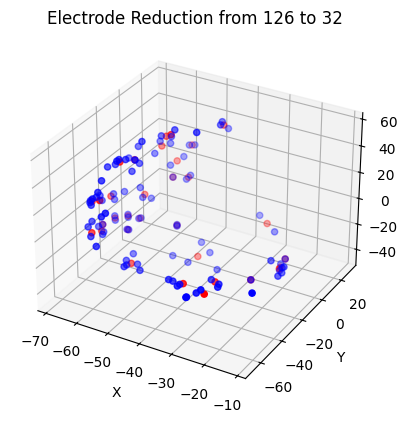

Reduced Electrode Positions:
[[-62.96603966 -20.64176178 -22.48437691]
 [-67.41557465 -23.03005466   2.12215707]
 [-45.520696    19.23548667  42.43284098]
 [-65.66354752 -43.72083759  13.83248138]
 [-65.29164505 -14.01807547 -18.15268707]
 [-55.09429995 -39.18231805 -29.47067928]
 [-63.26867676  -8.88824463 -22.2739296 ]
 [-61.74101893  -8.24894333  -3.02000372]
 [-57.82151413   6.86686993   2.64040017]
 [-67.94106293 -29.44626808 -15.66327953]
 [-63.25792694 -50.82478428  -3.17304855]
 [-23.05419445   7.13099909 -43.97796059]
 [-18.99953079  -6.92132874 -31.60053635]
 [-62.1334877  -15.68701696  28.48804903]
 [-56.13544083  20.26420593  19.76709175]
 [-45.20814896  -6.18614278 -41.67867279]
 [-31.43538284  19.85951424 -24.88890171]
 [-60.37358538 -33.16856098  39.71490924]
 [-29.16187477 -37.24518585 -26.00351906]
 [-60.46298141 -50.63459625  23.00642262]
 [-60.49435806   4.36935555  26.69843483]
 [-66.02682749 -35.42988714 -14.94598993]
 [-67.26716232 -20.33856869 -16.68870592]
 [-51

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.vq import kmeans, vq

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Plot original electrodes
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(electrodes[:, 0], electrodes[:, 1], electrodes[:, 2], color='b')

# Perform k-means clustering to reduce to 32 electrodes
centroids, _ = kmeans(electrodes, 32)
idx, _ = vq(electrodes, centroids)

# Plot reduced set of electrodes
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='r')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Electrode Reduction from 126 to 32')
plt.show()

# Print the coordinates of the reduced set of electrodes
print("Reduced Electrode Positions:")
print(centroids)


[[-22.44421705   6.79321273 -41.1067721 ]
 [-61.23985519 -29.07657394  39.04345169]
 [-56.93542862 -37.13744736  45.66228294]
 [-61.74101893  -8.24894333  -3.02000372]
 [-60.86082077 -55.69883728  -4.50213528]
 [-65.65503311 -45.95073128  -1.84396182]
 [-48.19318581  -8.57541037  54.16027641]
 [-53.81925837 -43.60455068 -28.25303205]
 [-59.67463112 -21.47732544  28.2441206 ]
 [-56.36934153 -34.76008542 -30.68832652]
 [-38.73535919 -47.77301788 -24.4678154 ]
 [-45.20814896  -6.18614278 -41.67867279]
 [-27.85814031 -40.31684621 -23.97160149]
 [-23.82296205 -61.1057682  -12.82803619]
 [-31.43538284  19.85951424 -24.88890171]
 [-19.76341502  -9.16123772 -31.87477811]
 [-64.69838095 -15.97166264 -19.89992487]
 [-39.85858154 -48.33027267 -23.67678833]
 [-67.41557465 -23.03005466   2.12215707]
 [-62.40699387 -47.41613642  26.66567739]
 [-58.28230286   7.05793834   6.86318409]
 [-65.66354752 -43.72083759  13.83248138]
 [-57.54696274 -55.462286    17.51754045]
 [-66.50538635 -33.93398237 -15.12

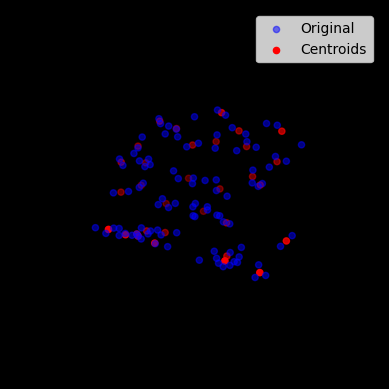

In [50]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.vq import kmeans, vq
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Perform k-means clustering to find 32 centroids
centroids, _ = kmeans(electrodes, 32)

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
print(centroids)
# Scatter plot for the original electrodes
ax.scatter(electrodes[:, 0], electrodes[:, 1], electrodes[:, 2], color='blue', alpha=0.5, label='Original')

# Scatter plot for the centroids
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='red', label='Centroids')

# Configure plot aesthetics
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis
ax.set_facecolor('black')
fig.patch.set_facecolor('black')
ax.legend()

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

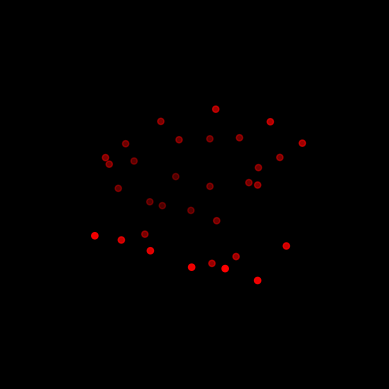

In [51]:
# Perform k-means clustering to find 32 centroids
centroids, _ = kmeans(electrodes, 32)

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for the centroids
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], color='red')

# Configure plot aesthetics
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())


[[-2.91618748e+01 -3.72451859e+01 -2.60035191e+01]
 [-6.27822752e+01 -9.96397805e+00 -1.97166240e+00]
 [-2.24442170e+01  6.79321273e+00 -4.11067721e+01]
 [-3.14353828e+01  1.98595142e+01 -2.48889017e+01]
 [-5.78215141e+01  6.86686993e+00  2.64040017e+00]
 [-6.32579269e+01 -5.08247843e+01 -3.17304855e+00]
 [-6.45923443e+01 -9.89670849e+00  2.87319775e+01]
 [-5.76971302e+01 -7.34222472e+00 -2.22759275e+01]
 [-5.93230797e+01  2.79886267e+00  3.14454845e+01]
 [-3.49398666e+01 -4.93545708e+01 -2.22983280e+01]
 [-5.65799370e+01 -5.62479744e+01  2.00933800e+01]
 [-4.71532974e+01  2.86886406e+01  3.26461906e+01]
 [-5.94039160e+01 -3.18737564e+01  4.23411630e+01]
 [-2.47516699e+01 -6.01612480e+01 -1.40689284e+01]
 [-6.77929573e+01 -2.50102978e+01  2.35935596e+00]
 [-4.47043953e+01  1.45089097e+01  4.73261662e+01]
 [-6.71656685e+01 -3.11119013e+01 -1.67692780e+01]
 [-4.81931858e+01 -8.57541037e+00  5.41602764e+01]
 [-4.55016670e+01 -1.03386326e+01 -4.35723979e+01]
 [-1.89995308e+01 -6.92132874e+

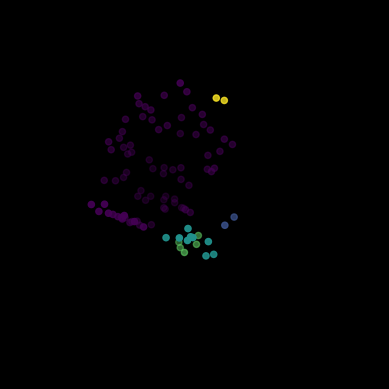

In [52]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])


# DBSCAN clustering
clustering = DBSCAN(eps=15, min_samples=2).fit(electrodes)
labels = clustering.labels_

# Positions for visualization are the points in each cluster
positions = electrodes[labels != -1]  # Exclude noise points if any

# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], c=labels[labels != -1], cmap='viridis')
print(centroids)
# Remove grid and axis lines
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis

# Set limits for better control of the viewing area, if necessary
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])

# Set the background color
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

[[-2.91618748e+01 -3.72451859e+01 -2.60035191e+01]
 [-6.27822752e+01 -9.96397805e+00 -1.97166240e+00]
 [-2.24442170e+01  6.79321273e+00 -4.11067721e+01]
 [-3.14353828e+01  1.98595142e+01 -2.48889017e+01]
 [-5.78215141e+01  6.86686993e+00  2.64040017e+00]
 [-6.32579269e+01 -5.08247843e+01 -3.17304855e+00]
 [-6.45923443e+01 -9.89670849e+00  2.87319775e+01]
 [-5.76971302e+01 -7.34222472e+00 -2.22759275e+01]
 [-5.93230797e+01  2.79886267e+00  3.14454845e+01]
 [-3.49398666e+01 -4.93545708e+01 -2.22983280e+01]
 [-5.65799370e+01 -5.62479744e+01  2.00933800e+01]
 [-4.71532974e+01  2.86886406e+01  3.26461906e+01]
 [-5.94039160e+01 -3.18737564e+01  4.23411630e+01]
 [-2.47516699e+01 -6.01612480e+01 -1.40689284e+01]
 [-6.77929573e+01 -2.50102978e+01  2.35935596e+00]
 [-4.47043953e+01  1.45089097e+01  4.73261662e+01]
 [-6.71656685e+01 -3.11119013e+01 -1.67692780e+01]
 [-4.81931858e+01 -8.57541037e+00  5.41602764e+01]
 [-4.55016670e+01 -1.03386326e+01 -4.35723979e+01]
 [-1.89995308e+01 -6.92132874e+

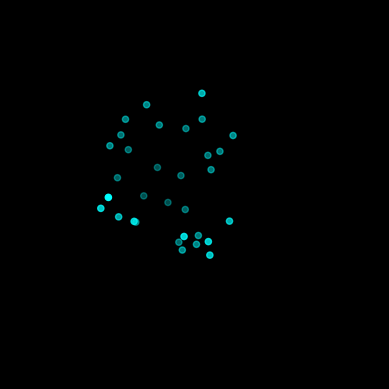

In [53]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

# Define electrode positions
positions = np.array([
    [-59.40391604, -31.87375641, 42.341163],
    [-65.66354752, -43.72083759, 13.83248138],
    [-51.5124588, -11.66290092, -41.49539948],
    [-63.25792694, -50.82478428, -3.17304855],
    [-42.49627113, -9.67649841, -44.61089706],
    [-23.05419445, 7.13099909, -43.97796059],
    [-27.85814031, -40.31684621, -23.97160149],
    [-65.17494901, -18.33280198, -19.10858997],
    [-57.6971302, -7.34222472, -22.27592754],
    [-46.37048721, 0.7046715, -36.41254807],
    [-58.74309158, 7.24900675, 11.08596802],
    [-63.44809469, -6.69529626, 27.03591665],
    [-67.79295731, -25.01029778, 2.35935596],
    [-60.99863307, -23.78995895, 29.66102918],
    [-55.09429995, -39.18231805, -29.47067928],
    [-31.43538284, 19.85951424, -24.88890171],
    [-11.72762775, -56.17873383, -6.52857351],
    [-62.7822752, -9.96397805, -1.9716624],
    [-57.54696274, -55.462286, 17.51754045],
    [-19.76341502, -9.16123772, -31.87477811],
    [-37.36216545, -50.07817173, -22.89596844],
    [-43.1652565, -0.61948764, -41.26362228],
    [-21.22426224, 6.11764002, -35.36439514],
    [-57.00943756, 14.88790417, 13.78476715],
    [-62.75046921, -48.41915131, 23.41569519],
    [-28.00768042, -61.15687656, -15.95401716],
    [-55.20776367, 9.15022628, 2.77334845],
    [-61.72004318, -45.41010666, 33.16564178],
    [-53.14139303, 23.07235082, 24.06012472],
    [-58.86395073, 3.57169628, 33.39590693],
    [-66.50538635, -33.93398237, -15.12531233],
    [-46.44879055, 2.96674967, 50.74322128]
])


# Create a 3D figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], color='cyan')
print(centroids)
# Remove grid and axis lines
ax.grid(False)  # Turn off the grid
ax.axis('off')  # Turn off the axis

# Set limits for better control of the viewing area, if necessary
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])

# Set the background color
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())

### 2 Use this to choose the channels, based on centroids

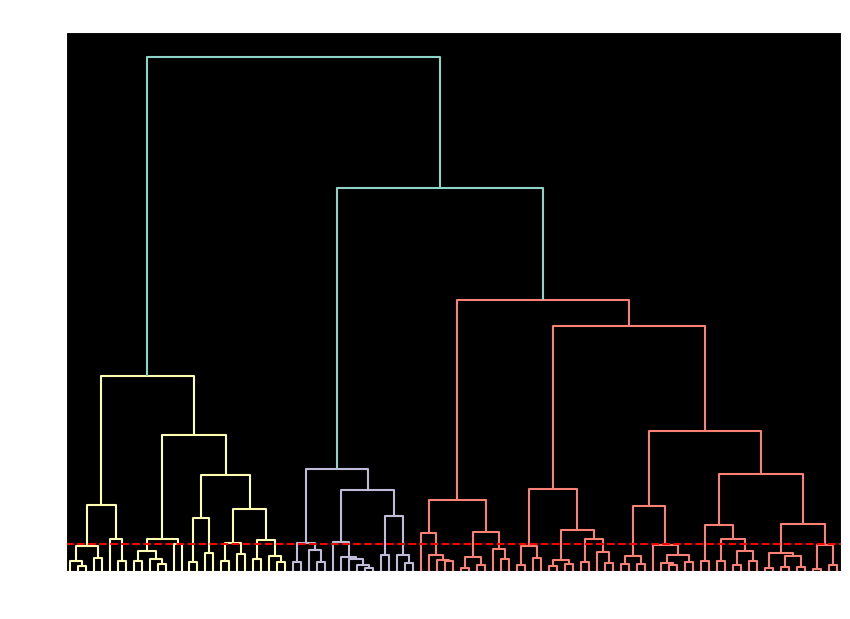

Number of clusters formed: 32
[[-5.62751640e+01  9.91751795e+00  6.63815610e+00]
 [-5.61354408e+01  2.02642059e+01  1.97670918e+01]
 [-4.71532974e+01  2.86886406e+01  3.26461906e+01]
 [-6.16746635e+01 -3.22859821e+01  3.79802750e+01]
 [-5.58484077e+01 -2.91139269e+01  4.83202248e+01]
 [-4.47043953e+01  1.45089097e+01  4.73261662e+01]
 [-4.81931858e+01 -8.57541037e+00  5.41602764e+01]
 [-5.96746311e+01 -2.14773254e+01  2.82441206e+01]
 [-6.45923443e+01 -9.89670849e+00  2.87319775e+01]
 [-5.75661621e+01  4.43123341e-01  3.85660591e+01]
 [-6.04943581e+01  4.36935555e+00  2.66984348e+01]
 [-4.47678719e+01  4.25919294e-02 -3.88380852e+01]
 [-4.55016670e+01 -1.03386326e+01 -4.35723979e+01]
 [-1.89995308e+01 -6.92132874e+00 -3.16005363e+01]
 [-2.35828362e+01 -2.03607826e+01 -3.32459869e+01]
 [-3.14353828e+01  1.98595142e+01 -2.48889017e+01]
 [-2.24442170e+01  6.79321273e+00 -4.11067721e+01]
 [-2.80076804e+01 -6.11568766e+01 -1.59540172e+01]
 [-1.17276278e+01 -5.61787338e+01 -6.52857351e+00]
 

/tmp/ipykernel_24717/3823125173.py:139: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], cmap='viridis')


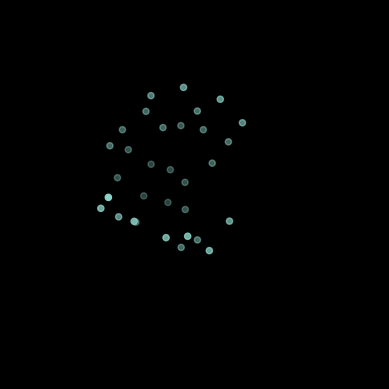

In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Electrode positions
electrodes = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])

# Perform hierarchical clustering
Z = linkage(electrodes, 'ward')  # 'ward' method minimizes the variance within clusters

# Plot the dendrogram to determine a suitable cut-off
plt.figure(figsize=(10, 7))
plt.style.use('dark_background')  # Set background color to black
dendrogram(Z)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Electrode Index')
plt.ylabel('Distance')
plt.axhline(y=17.5, color='r', linestyle='--')  # Example line to visualize the current cut-off
plt.show()

# Experiment with this value to get approximately 32 clusters:
cut_off_distance = 17.5  # You might need to adjust this based on the dendrogram

# Form flat clusters
clusters = fcluster(Z, cut_off_distance, criterion='distance')

# Calculate the number of clusters and adjust if necessary
actual_number_of_clusters = len(np.unique(clusters))
print(f"Number of clusters formed: {actual_number_of_clusters}")
# Calculate centroids of these clusters
centroids = np.array([electrodes[clusters == k].mean(axis=0) for k in np.unique(clusters)])
print(centroids)

# Create a 3D figure for visualization
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2], cmap='viridis')

# Configure plot aesthetics
ax.grid(False)
ax.axis('off')
ax.set_xlim([-70, 70])
ax.set_ylim([-70, 70])
ax.set_zlim([-50, 50])
ax.set_facecolor('black')
fig.patch.set_facecolor('black')

# Update function for the animation
def update(frame):
    ax.view_init(elev=10, azim=frame)
    return scatter,

# Creating the animation
ani = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50, blit=True)

# Display the animation in a Jupyter notebook
HTML(ani.to_jshtml())


### 3 match the centroids we found to the actual ecog channels in the dataset

In [4]:
import numpy as np
from scipy.spatial import cKDTree

# Given electrode positions and their names
# Electrode positions
electrode_positions = np.array([
    [-25.2506713867188, -46.4601669311523, -19.9077663421631],  # A1
    [-34.8354873657227, 22.9607810974121, -23.0175247192383],  # A10
    [-21.7402248382568, -6.64200353622437, -27.4371452331543], # A11
    [-18.6960258483887, -5.11181783676147, -31.892993927002],  # A12
    [-22.4581089019775, 4.67567157745361, -44.2997894287109],  # A13
    [-23.6502799987793, 9.58632659912109, -43.6561317443848],  # A14
    [-43.1652565002441, -0.619487643241882, -41.2636222839355],# A15
    [-46.3704872131348, 0.704671502113342, -36.4125480651855], # A16
    [-38.1678657531738, -8.46309852600098, -45.2443046569824], # A17
    [-46.8246765136719, -10.8898983001709, -43.9774894714355],# A18
    [-51.5124588012695, -11.6629009246826, -41.4953994750977],# A19
    [-27.0217590332031, -40.117847442627, -23.9372749328613], # A2
    [-63.4022407531738, -9.55733680725098, -22.1126518249512],# A20
    [-65.3118057250977, -14.0451583862305, -17.0188121795654],# A21
    [-67.5814895629883, -19.7214088439941, -15.6563234329224],# A22
    [-27.9251098632813, -67.0609588623047, -13.5704069137573],# A23
    [-29.3864498138428, -62.398193359375, -18.0683307647705],# A24
    [-35.2633018493652, -53.6502380371094, -21.0094184875488],# A25
    [-38.7353591918945, -47.7730178833008, -24.4678153991699],# A26
    [-50.9128532409668, -42.9884338378906, -28.9345359802246],# A27
    [-53.9806747436523, -36.7598724365234, -31.1489963531494],# A28
    [-58.1110954284668, -29.1852054595947, -31.6894721984863],# A29
    [-31.3019905090332, -34.3725242614746, -28.0697631835938],# A3
    [-62.5173568725586, -21.0995330810547, -21.9829063415527],# A30
    [-11.7276277542114, -56.1787338256836, -6.52857351303101],# A31
    [-26.2526607513428, -58.7851867675781, -13.1448335647583],# A32
    [-28.4665012359619, -56.3831672668457, -19.0324974060059],# A33
    [-35.5914192199707, -50.5591583251953, -22.4298515319824],# A34
    [-39.8585815429688, -48.3302726745605, -23.6767883300781],# A35
    [-54.8781967163086, -46.0783615112305, -26.6370048522949],# A36
    [-55.6667251586914, -41.7468566894531, -29.1875553131104],# A37
    [-57.0162544250488, -38.3351783752441, -29.2265110015869],# A38
    [-23.582836151123, -20.360782623291, -33.2459869384766], # A4
    [-17.7847995758057, -12.162317276001, -32.3428192138672], # A5
    [-18.1879768371582, -7.05427694320679, -34.0022277832031],# A6
    [-18.5886268615723, -3.63622808456421, -32.3274955749512],# A7
    [-21.2242622375488, 6.11764001846313, -35.3643951416016], # A8
    [-28.0352783203125, 16.7582473754883, -26.7602787017822], # A9
    [-57.8286209106445, -20.6463985443115, 48.252368927002], # B12
    [-58.0694885253906, -2.72444772720337, 40.5788383483887], # B13
    [-57.0628356933594, 3.61069440841675, 36.553279876709],  # B14
    [-56.1463088989258, 17.6686248779297, 21.4072494506836], # B15
    [-56.1245727539063, 22.8597869873047, 18.1269340515137], # B16
    [-60.0026626586914, -36.6934394836426, 42.9364852905273],# B17
    [-60.7821044921875, -32.7868499755859, 40.9548950195313],# B18
    [-60.023120880127, -29.1654148101807, 39.0438537597656], # B19
    [-59.4748229980469, -18.7014503479004, 29.5034332275391],# B20
    [-63.1210441589355, -9.56109428405762, 33.874137878418],# B21
    [-61.1171989440918, 4.58471012115479, 29.807653427124], # B22
    [-59.2062797546387, 8.81582832336426, 26.643856048584], # B23
    [-57.0094375610352, 14.8879041671753, 13.7847671508789], # B24
    [-61.720043182373, -45.4101066589355, 33.165641784668], # B25
    [-63.9187927246094, -34.3689804077148, 34.4712944030762], # B26
    [-63.6466369628906, -28.415225982666, 32.4948463439941], # B27
    [-59.874439239502, -24.2532005310059, 26.9848079681396], # B28
    [-66.0636444091797, -10.2323226928711, 23.5898170471191], # B29
    [-61.159595489502, -0.292471796274185, 23.6437950134277], # B30
    [-58.743091583252, 7.24900674819946, 11.0859680175781],  # B31
    [-53.5563163757324, 11.2221298217773, 3.93006443977356],  # B32
    [-62.226146697998, -47.4427185058594, 25.5266380310059], # B33
    [-64.702766418457, -42.3805656433105, 16.7664794921875], # B34
    [-66.9945602416992, -41.6043395996094, 12.0351648330688], # B35
    [-68.2476043701172, -30.240213394165, 7.05649328231812], # B36
    [-67.4387359619141, -20.6998691558838, 2.28034591674805], # B37
    [-62.5698928833008, -9.9558162689209, 2.9089457988739],  # B38
    [-57.8215141296387, 6.86686992645264, 2.64040017127991], # B39
    [-43.9641609191895, -10.779411315918, 57.29541015625],  # B4
    [-54.2454605102539, 9.36167907714844, 1.74958074092865], # B40
    [-63.2747917175293, -49.3955841064453, 21.3047523498535],# B41
    [-65.1447296142578, -46.7502136230469, 15.3835172653198],# B42
    [-65.8121337890625, -44.1482315063477, 11.1447639465332],# B43
    [-68.5068359375, -27.9424781799316, 1.51621115207672],  # B44
    [-66.9786529541016, -21.1586303710938, -1.41562652587891], # B45
    [-65.9060440063477, -15.1090822219849, 1.1733615398407], # B46
    [-61.8243598937988, -9.91696071624756, -4.20156574249268],# B47
    [-60.8288040161133, -4.87405300140381, -7.76739120483398],# B48
    [-56.5799369812012, -56.247974395752, 20.0933799743652], # B49
    [-52.4222106933594, -6.37140941619873, 51.0251426696777],# B5
    [-58.513988494873, -54.6765975952148, 14.9417009353638], # B50
    [-65.369743347168, -44.9920272827148, -0.254678934812546],# B51
    [-66.8766403198242, -35.7145004272461, -11.8897895812988],# B52
    [-67.9410629272461, -29.446268081665, -15.6632795333862],# B53
    [-66.9528350830078, -20.9557285308838, -17.7210884094238],# B54
    [-51.5873489379883, -7.33667898178101, -21.3333129882813],# B55
    [-52.663818359375, -4.25573062896729, -23.2225379943848],# B56
    [-58.6212387084961, -59.2863464355469, -4.00015497207642],# B57
    [-63.1004028320313, -52.111328125, -5.00411558151245], # B58
    [-65.9403228759766, -46.9094352722168, -3.4332447052002],# B59
    [-44.1223983764648, 11.9484453201294, 48.134521484375], # B6
    [-64.8135681152344, -37.7976264953613, -15.0729036331177],# B60
    [-66.3902740478516, -32.7775344848633, -17.8752765655518],# B61
    [-63.414722442627, -20.1839904785156, -22.9858474731445],# B62
    [-65.271484375, -13.9909925460815, -19.2865619659424], # B63
    [-63.1351127624512, -8.21915245056152, -22.4352073669434],# B64
    [-45.2863922119141, 17.0693740844727, 46.5178108215332],# B7
    [-47.1532974243164, 28.6886405944824, 32.6461906433105], # B8
    [-53.8681945800781, -37.5814552307129, 48.3880805969238],# B9
])


electrode_names = [
    "A1", "A10", "A11", "A12", "A13", "A14", "A15", "A16",
    "A17", "A18", "A19", "A2", "A20", "A21", "A22", "A23",
    "A24", "A25", "A26", "A27", "A28", "A29", "A3", "A30",
    "A31", "A32", "A33", "A34", "A35", "A36", "A37", "A38",
    "A39", "A4", "A40", "A41", "A42", "A43", "A44", "A45",
    "A46", "A47", "A48", "A49", "A5", "A50", "A51", "A52",
    "A53", "A54", "A55", "A56", "A57", "A58", "A59", "A6",
    "A60", "A61", "A62", "A63", "A64", "A7", "A8", "A9",
    "B12", "B13", "B14", "B15", "B16", "B17", "B18", "B19",
    "B20", "B21", "B22", "B23", "B24", "B25", "B26", "B27",
    "B28", "B29", "B30", "B31", "B32", "B33", "B34", "B35",
    "B36", "B37", "B38", "B39", "B4", "B40", "B41", "B42",
    "B43", "B44", "B45", "B46", "B47", "B48", "B49", "B5",
    "B50", "B51", "B52", "B53", "B54", "B55", "B56", "B57",
    "B58", "B59", "B6", "B60", "B61", "B62", "B63", "B64",
    "B7", "B8", "B9"
]


# Create a KD-tree for quick nearest-neighbor lookup
tree = cKDTree(electrode_positions)

# Find the closest electrode for each centroid
distances, indices = tree.query(centroids, k=1)

# Map centroids to electrode names using the indices
matched_names = [electrode_names[idx] for idx in indices]

# Output matched names
for centroid, name in zip(centroids, matched_names):
    print(f"Centroid {centroid} matched to Electrode {name}")

# Optionally, you can also inspect the distance to confirm a good match
for dist, name in zip(distances, matched_names):
    print(f"Electrode {name} with distance {dist:.2f}")

Centroid [-56.27516403   9.91751795   6.6381561 ] matched to Electrode A62
Centroid [-56.13544083  20.26420593  19.76709175] matched to Electrode A47
Centroid [-47.15329742  28.68864059  32.64619064] matched to Electrode B42
Centroid [-61.67466354 -32.28598213  37.98027496] matched to Electrode A5
Centroid [-55.84840775 -29.11392689  48.32022476] matched to Electrode B43
Centroid [-44.70439529  14.5089097   47.32616615] matched to Electrode B41
Centroid [-48.19318581  -8.57541037  54.16027641] matched to Electrode B25
Centroid [-59.67463112 -21.47732544  28.2441206 ] matched to Electrode A59
Centroid [-64.59234428  -9.89670849  28.73197746] matched to Electrode A6
Centroid [-57.56616211   0.44312334  38.56605911] matched to Electrode A46
Centroid [-60.49435806   4.36935555  26.69843483] matched to Electrode A53
Centroid [-4.47678719e+01  4.25919294e-02 -3.88380852e+01] matched to Electrode A16
Centroid [-45.50166702 -10.33863258 -43.57239787] matched to Electrode A18
Centroid [-18.9995

### 4 Plot to check the signals

Extracting EDF parameters from /home/vincent/MySSD/JupyterProjects/AAA_projects/UnlimitedResearchCooperative/Synthetic_Intelligence_Labs/Bio-Silicon-Synergetic-Intelligence-System/Software/PC/Backend/desktop_browser_app/signals_monitor/CNN_feature_extraction_project/sub-01_ses-task_task-game_run-01_ieeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1898115  =      0.000 ...  1898.115 secs...
Adjusted matched names: ['POL A62', 'POL A47', 'POL B42', 'POL A5', 'POL B43', 'POL B41', 'POL B25', 'POL A59', 'POL A6', 'POL A46', 'POL A53', 'POL A16', 'POL A18', 'POL A12', 'POL A39', 'POL A10', 'POL A13', 'POL A24', 'POL A31', 'POL A34', 'POL A2', 'POL B34', 'POL B18', 'POL B26', 'POL A63', 'POL B38', 'POL A38', 'POL A8', 'POL B22', 'POL B21', 'POL B30', 'POL B40']
Indices: [54, 99, 4, 100, 98, 82, 5, 53, 13, 15, 23, 46, 9, 10, 24, 31, 34, 91, 75, 83, 95, 43, 7, 79, 78, 87, 97]


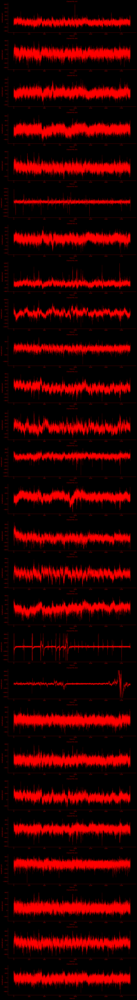

In [6]:
import pyedflib
import mne
import matplotlib.pyplot as plt
import numpy as np

# Path to your EDF file
file_path = 'sub-01_ses-task_task-game_run-01_ieeg.edf'

# Load the EDF file
raw = mne.io.read_raw_edf(file_path, preload=True, stim_channel=None)

# Electrode names matched to centroids (retrieved from your earlier analysis)
matched_names = ['A62', 'A47', 'B42', 'A5', 'B43', 'B41', 'B25', 'A59', 'A6', 'A46', 'A53', 'A16', 'A18', 'A12', 'A39', 'A10', 'A13', 'A24', 'A31', 'A34', 'A2', 'B34', 'B18', 'B26', 'A63', 'B38', 'A38', 'A8', 'B22', 'B21', 'B30', 'B40']

# Function to generate the corresponding channel names with the "POL" prefix
def generate_pol_channel_name(name):
    return f'POL {name}'

# Adjusted matched names with "POL" prefix
adjusted_matched_names = [generate_pol_channel_name(name) for name in matched_names]

print("Adjusted matched names:", adjusted_matched_names)

# Filter to keep only the indices of channels that are in adjusted_matched_names
indices = [raw.ch_names.index(name) for name in adjusted_matched_names if name in raw.ch_names]

print("Indices:", indices)

# Extract data for these channels
selected_data, times = raw[indices, :]

# Plotting
plt.figure(figsize=(15, 4 * len(indices)), facecolor='black')
for i, idx in enumerate(indices):
    plt.subplot(len(indices), 1, i + 1)
    plt.plot(times, selected_data[i], color='red', linewidth=0.5)
    plt.title(f'Channel {raw.ch_names[idx]}', color='red', fontsize=10)
    plt.xlabel('Time (s)', color='red')
    plt.ylabel('Amplitude (µV)', color='red')
    plt.xticks(color='red')
    plt.yticks(color='red')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['bottom'].set_color('red')
    plt.gca().spines['left'].set_color('red')
    plt.gca().set_facecolor('black')

plt.tight_layout()
plt.show()


### Remove the "POL " from each channel name and save each channel as npy

In [8]:
import numpy as np

# Assuming 'selected_data' contains the data for channels and 'adjusted_matched_names' contains the channel names like "POL A62"
clean_names = [name[4:] for name in adjusted_matched_names]  # List comprehension to strip the first four characters from each name

# Save both the channel names and the data to a .npz file
np.savez('all_channels_data.npz', data=selected_data, names=clean_names)

### See what the channels are named

In [62]:
print(raw.ch_names)  # Print the first 30 channel names to get an idea of the naming format

['EEG A1-Ref', 'EEG A2-Ref', 'POL A3', 'POL A4', 'POL A5', 'POL A6', 'POL A7', 'POL A8', 'POL A9', 'POL A10', 'POL A13', 'POL A14', 'POL A15', 'POL A16', 'POL A17', 'POL A18', 'POL A19', 'POL A20', 'POL A21', 'POL E', 'POL A22', 'POL A23', 'POL A11', 'POL A12', 'POL A24', 'POL A25', 'POL A26', 'POL A27', 'POL A28', 'POL A29', 'POL A30', 'POL A31', 'POL A32', 'POL A33', 'POL A34', 'POL A35', 'POL A36', 'POL DC01', 'POL DC02', 'POL DC03', 'POL DC04', 'POL SPO2', 'POL A37', 'POL A38', 'POL $A11', 'POL $A12', 'POL A39', 'POL A40', 'POL A41', 'POL A42', 'POL A43', 'POL A44', 'POL A45', 'POL A46', 'POL A47', 'POL A48', 'POL A49', 'POL A50', 'POL B1', 'POL B2', 'POL B3', 'POL B4', 'POL B5', 'POL B6', 'POL B7', 'POL B8', 'POL B9', 'POL B10', 'POL B11', 'POL B12', 'POL B13', 'POL B14', 'POL B15', 'POL B16', 'POL B17', 'POL B18', 'POL B19', 'POL B20', 'POL B21', 'POL B22', 'POL B23', 'POL B24', 'POL B25', 'POL B26', 'POL B27', 'POL B28', 'POL B29', 'POL B30', 'POL B31', 'POL B32', 'POL B33', 'PO

### Feature extraction (need to work on this)

In [ ]:
def scale_data(data, factor=2):
    if data.ndim != 2 or data.shape[0] != 32:
        raise ValueError(f"Unexpected data shape: {data.shape}. Expected (32, number_of_samples).")
    # Simple subsampling by taking every 'factor'-th sample
    subsampled_data = data[:, ::factor]

    # Scaling to range [0, 1]
    data_min = np.min(subsampled_data, axis=1, keepdims=True)
    data_max = np.max(subsampled_data, axis=1, keepdims=True)

    # Avoid division by zero in case data_max equals data_min
    scaled_data = (subsampled_data - data_min) / np.where(data_max > data_min, data_max - data_min, 1)

    return scaled_data


def detect_peaks(signals):
    peaks_results = []
    # Dynamically setting parameters based on signal characteristics
    median_height = np.median(signals)
    std_height = np.std(signals)
    height = median_height + std_height  # Setting height to be above median + 1 std deviation
    distance = len(signals) * 0.05  # Example to set distance to 5% of signal length
    prominence = std_height * 0.5  # Setting prominence to be half of std deviation

    # Detecting peaks
    peaks, properties = find_peaks(signals, height=height, distance=distance, prominence=prominence)

    # Calculating properties if peaks were found
    if peaks.size > 0:
        peak_count = len(peaks)
        average_peak_height = np.mean(properties["peak_heights"])
        average_distance = np.mean(np.diff(peaks)) if len(peaks) > 1 else 0
        average_prominence = np.mean(properties["prominences"])

        # Appending results for each channel
        peaks_results.append({
            "peak_count": peak_count,
            "average_peak_height": average_peak_height,
            "average_distance": average_distance,
            "average_prominence": average_prominence,
        })

    else:
        peak_count = 0
        average_peak_height = 0
        average_distance = 0
        average_prominence = 0

        # Appending results for each channel
        peaks_results.append({
            "peak_count": peak_count,
            "average_peak_height": average_peak_height,
            "average_distance": average_distance,
            "average_prominence": average_prominence,
        })

    return peaks_results


def calculate_variance_std_dev(signals):
    # Calculating variance and standard deviation
    variance = np.var(signals, axis=1)
    std_dev = np.std(signals, axis=1)
    return variance, std_dev


def calculate_rms(signals):
    # Calculating RMS value
    rms = np.sqrt(np.mean(signals ** 2, axis=1))
    return rms


def freq_bands(signals, fs=constants.SAMPLING_RATE):
    downsampled_signal = []
    band_features = np.zeros((signals.shape[0], 4))

    for i, signal in enumerate(signals):

        nperseg = min(32, len(downsampled_signal))

        frequencies, psd = welch(downsampled_signal, fs, nperseg=nperseg)

        print("Frequencies:", frequencies)
        print("PSD:", psd)

        bands = {'delta': (1, 4), 'theta': (4, 8), 'alpha': (8, 13), 'beta': (13, 30)}
        for j, (name, (low, high)) in enumerate(bands.items()):
            idx = np.logical_and(frequencies >= low, frequencies <= high)
            if np.any(idx):
                band_features[i, j] = np.nanmean(psd[idx])
            else:
                band_features[i, j] = 0.0

    return band_features


def calculate_spectral_entropy(neural_data_array, fs):
    # Initialize an array to hold spectral entropy values for each channel
    spectral_entropy_values = np.zeros(neural_data_array.shape[0])

    for i, signal in enumerate(neural_data_array):
        # Determine nperseg based on the length of the signal
        nperseg = min(len(signal), fs * 2)
        # Calculate the power spectral density (PSD) using Welch's method
        frequencies, psd = welch(signal, fs=fs, nperseg=nperseg)

        # Check if the sum of psd is zero
        if np.sum(psd) == 0:
            spectral_entropy_values[i] = 0.0  # Set spectral entropy to 0
        else:
            # Normalize the PSD to get a probability distribution for entropy calculation
            normalized_psd = psd / np.sum(psd)
            # Calculate the spectral entropy
            spectral_entropy = -np.sum(normalized_psd * np.log2(normalized_psd))
            # Store the spectral entropy value in the array
            spectral_entropy_values[i] = spectral_entropy

    return spectral_entropy_values


def spectral_centroids(signals, fs):
    # Calculate the spectral centroids for each signal
    centroids = []
    for signal in signals:
        fft_result = fft(signal)
        frequencies = fftfreq(len(signal), 1.0 / fs)
        magnitude = np.abs(fft_result)
        centroid = np.sum(frequencies * magnitude) / np.sum(magnitude)
        centroids.append(centroid)
    return centroids


def spectral_edge_density(signals, fs, percentage=95):
    spectral_edge_densities = []

    for signal in signals:
        fft_result = fft(signal)
        frequencies = fftfreq(len(signal), 1.0 / fs)
        positive_frequencies = frequencies[frequencies >= 0]
        positive_fft_result = fft_result[frequencies >= 0]
        magnitude = np.abs(positive_fft_result)
        cumulative_sum = np.cumsum(np.sort(magnitude)[::-1])
        total_power = np.sum(magnitude)
        threshold = total_power * (percentage / 100)
        spectral_edge = positive_frequencies[np.argmax(cumulative_sum >= threshold)]
        spectral_edge_densities.append(spectral_edge)

    return spectral_edge_densities


def phase_locking_values(signals):
    # Compute the analytical signal for each input signal
    num_signals = signals.shape[0]
    plv_matrix = np.zeros((num_signals, num_signals))

    for i in range(num_signals):
        for j in range(i + 1, num_signals):  # Only compute for unique pairs
            signal1 = signals[i]
            signal2 = signals[j]

            # Compute the analytical signal for each input signal
            analytic_signal1 = hilbert(signal1)
            analytic_signal2 = hilbert(signal2)

            # Compute the instantaneous phase for each analytical signal
            phase1 = np.angle(analytic_signal1)
            phase2 = np.angle(analytic_signal2)

            # Compute the phase difference
            phase_diff = phase1 - phase2

            # Compute the PLV
            plv = np.abs(np.sum(np.exp(1j * phase_diff)) / len(signal1))

            # Store the PLV in the matrix
            plv_matrix[i, j] = plv
            plv_matrix[j, i] = plv  # PLV is symmetric

    return plv_matrix


def calculate_higuchi_fractal_dimension(signals, k_max):
    hfd_values = []  # To store HFD for each channel

    for signal in signals:
        N = len(signal)
        L = []
        x = np.asarray(signal)
        for k in range(1, k_max + 1):
            Lk = []
            for m in range(k):
                Lkm_sum = 0
                max_index = int((N - m - 1) / k) + 1  # Ensures valid indexing
                for i in range(1, max_index):
                    Lkm_sum += abs(x[m + i * k] - x[m + (i - 1) * k])
                if max_index - 1 > 0:  # Check to avoid division by zero
                    Lkm = Lkm_sum * (N - 1) / (k * (max_index - 1))
                    Lk.append(Lkm)
                else:
                    Lk.append(0)  # Or handle appropriately

            # Check if Lk contains non-zero values before taking log
            if np.mean(Lk) > 0:
                L.append(np.log(np.mean(Lk)))
            else:
                # Handle the case where np.mean(Lk) results in 0 or a negative number
                # For example, append a very small positive value or handle as an error
                L.append(np.log(np.finfo(float).eps))  # Using machine epsilon for a small positive number

        # Proceed with polyfit only if L contains valid log values
        if len(L) > 0 and np.all(np.isfinite(L)):
            hfd = np.polyfit(np.log(range(1, k_max + 1)), L, 1)[0]  # Linear fit to log-log plot
            hfd_values.append(hfd)
        else:
            # Handle the case where HFD cannot be computed due to invalid L values
            hfd_values.append(np.nan)  # Append NaN or another placeholder to indicate failure

    return hfd_values


def calculate_zero_crossing_rate(signals):
    sign_changes = np.diff(np.sign(signals), axis=1)
    zero_crossings = np.count_nonzero(sign_changes, axis=1)
    zero_crossing_rates = zero_crossings / (signals.shape[1] - 1)

    print("Sign Changes:", sign_changes)
    print("Zero Crossings:", zero_crossings)

    return zero_crossing_rates


def perform_empirical_mode_decomposition(signals):
    # Initialize EMD
    emd = EMD()
    imfs = None

    # Initialize an empty list to store IMFs for each signal
    imfs_all_signals = []

    # Loop through each signal
    for signal in signals:
        # Perform EMD decomposition for the current signal
        imfs = emd(signal)

        # Append the IMFs of the current signal to the list
        imfs_all_signals.append(imfs)

    # Convert the list of IMFs into a NumPy array
    imfs_all_signals = np.array(imfs_all_signals)

    return imfs


def time_warping_factor(signals):
    # Calculate the average signal (mean across all signals for each time point)
    average_signal = np.mean(np.array(signals), axis=0)
    warping_factors = []
    for signal in signals:
        # Ensure that the signals are 1-D
        signal = np.atleast_1d(signal)
        average_signal = np.atleast_1d(average_signal)

        print("Signal shape:", signal.shape)
        print("Average signal shape:", average_signal.shape)
        distance, _ = fastdtw(np.squeeze(signal), np.squeeze(average_signal), dist=euclidean)

        # Calculate the DTW distance between the signal and the average signal
        distance, _ = fastdtw(np.squeeze(signal), np.squeeze(average_signal), dist=euclidean)

        # Append the distance as the warping factor for this signal
        warping_factors.append(distance)
    return warping_factors


def evolution_rate(signals):
    rates = np.zeros(signals.shape[0])

    for i, signal in enumerate(signals):
        analytic_signal = hilbert(signal)
        envelope = np.abs(analytic_signal)
        derivative = np.diff(envelope)
        rates[i] = np.mean(np.abs(derivative))

        print("Analytic Signal:", analytic_signal)
        print("Envelope:", envelope)
        print("Derivative:", derivative)

    return rates


def analyze_signals(buffer):
    analyze_signals_results = constants.AnalyzeSignalsResult()
    signals = buffer.T  # Assuming signals are organized as channels x samples in the buffer
    analyze_signals_results.peak_heights = 0
    # peak_heights = detect_peak_heights(signals)
    analyze_signals_results.peak_counts = detect_peaks(signals)
    analyze_signals_results.variance, analyze_signals_results.std_dev = calculate_variance_std_dev(signals)
    analyze_signals_results.rms = calculate_rms(signals)

    band_features = freq_bands(signals, constants.SAMPLING_RATE)  # Assuming this returns an array of shape (

    analyze_signals_results.band_features = band_features
    # num_signals, num_bands)
    # Assuming band_features order: delta, theta, alpha, beta
    analyze_signals_results.delta_band_power = band_features[:, 0]  # Delta band powers for all signals
    analyze_signals_results.theta_band_power = band_features[:, 1]  # Theta band powers for all signals
    analyze_signals_results.alpha_band_power = band_features[:, 2]  # Alpha band powers for all signals
    analyze_signals_results.beta_band_power = band_features[:, 3]  # Beta band powers for all signals
    # spectral_entropy_values = spectral_entropy_values(signals, FS)
    analyze_signals_results.centroids = spectral_centroids(signals, constants.SAMPLING_RATE)
    analyze_signals_results.spectral_edge_densities = spectral_edge_density(signals, constants.SAMPLING_RATE, 95)
    # plv = phase_locking_values(signals)
    analyze_signals_results.hfd_values = calculate_higuchi_fractal_dimension(signals, k_max=10)
    analyze_signals_results.zero_crossing_rate = calculate_zero_crossing_rate(signals)
    # imfs = perform_empirical_mode_decomposition(signals)
    # warping_factors = time_warping_factor(signals)
    analyze_signals_results.rates = evolution_rate(signals)

    results = analyze_signals_results.to_dict()
    results = analyze_signals_results.to_python_float(results)

    # Print the results
    print("Analysis Results:")
    for key, value in results.items():
        print(f"{key}: {value}")
    return results


